In [1]:
using ControlSystemsBase, LinearAlgebra, Plots, Statistics, LaTeXStrings

First, we start by a simple LQR control design of the following linear system:

In [2]:
Δ = 0.1
A = [0.98 Δ; 0 0.95];
B = [0; Δ;;];
C = I;
D = 0;
sys = ss(A,B,C,D,Δ)

V = [0.2;;]
W = diagm([0.2, 0.1])

Q = I
R = 2I

K_LQR = -lqr(sys, Q, R)

display(K_LQR)

1×2 Matrix{Float64}:
 -0.441338  -0.788109

We can also achieve the same optimal controller using the controllability-type Gramian, i.e., via LMIs in an SDP (Problem~2 in the paper):

In [3]:
using JuMP
using MosekTools, SCS

In [4]:
model = Model(Mosek.Optimizer);
rₓ = size(A)[1]
rᵤ = size(B)[2]
@variable(model, Σ[i=1:rₓ, j=1:rₓ], PSD)
@variable(model, Z₀[i=1:rᵤ, j=1:rᵤ], PSD)
@variable(model, L[i=1:rᵤ, j=1:rₓ])
@objective(model, Min, tr(Q*Σ) + tr(R*Z₀))
@constraint(model, Σ-1e-5*I >= 0, PSDCone())
@constraint(model, [Z₀ L; L' Σ] >= 0, PSDCone())
# Lyupanov
@constraint(model, Σ - (A*Σ*A' + B*L*A' +
 A*L'*B' +  B*Z₀*B' + W + B*V*B') >= 0, PSDCone());
@constraint(model, Σ - (A*Σ*A' + B*L*A' +
 A*L'*B' +  B*Z₀*B' + W + B*V*B') <= 0, PSDCone());

set_silent(model)
optimize!(model);

L, Σ, Z₀ = value.(L), value.(Σ), value.(Z₀)
K_LMI = L * inv(Σ) 

1×2 Matrix{Float64}:
 -0.441307  -0.788125

The error between the two control gains:

In [5]:
norm(K_LMI - K_LQR, 2) # the two norm of the difference.

3.4972305338699715e-5

We now seek to do the previous step again, but with $(A,B)$ being identified from data.

First, we use the double integrator model above, to generate noisy data, under a stabilizing controller $K_0$ and a persistently exciting additive input $v_k$. That is, $u_k = K_0 x_k + v_k$.

In [93]:
function f(x::Vector{Float64}, u::Vector{Float64})
    x⁺ = zero.(x);
    x⁺ = A * x + B * u + sqrt(W) * randn(size(x⁺))
    x⁺[1] += .05 * x[2] ^ 2
    return x⁺
end

f (generic function with 1 method)

In [23]:
function f_dataGen_CL(x₀::Vector{Float64}, K::Matrix{Float64}, N::Int)
    X = zeros(Float64, size(K)[2], N+1)
    U = zeros(Float64, size(K)[1], N)
    X[:,1] = x₀
    for j=1:N
        U[:,j] = K * X[:,j] + sqrt(V) * randn(rᵤ,)
        X[:,j+1] = f(X[:,j], U[:,j])
    end
    return X[:,1:end-1], U
end

f_dataGen_CL (generic function with 1 method)

2-element Vector{Float64}:
 0.05215553368329004
 0.97784446631671

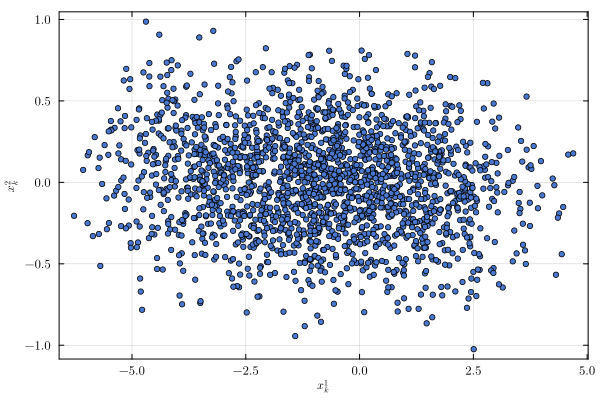

In [94]:
N = 2000
x₀ = zeros(Float64, 2,)
K₀ = [-0.2  -9.0]

X, U = f_dataGen_CL(x₀, K₀, N)
display(abs.(eigen(A + B * K₀).values))

plt = plot(
    framestyle = :box,
    yguidefontsize = 8,
    xguidefontsize = 8,
    xtickfontsize = 8,
    ytickfontsize = 8,
    ylabel = L"$x^2_k$",
    xlabel = L"$x^1_k$",
    palette = :seaborn_muted,
    legend=:none,
    foreground_color_legend = nothing,
    legendfontsize=5,
    fontfamily = "Computer Modern",
    markersize = 2,
)
plot_data_exp = scatter!(plt, X[1,:], X[2,:], markersize = 3) 
#[:none, :auto, :circle, :rect, :star5, :diamond, :hexagon, :cross, :xcross, :utriangle, :dtriangle, :rtriangle, :ltriangle, :pentagon, :heptagon, :octagon, :star4, :star6, :star7, :star8, :vline, :hline, :+, :x].

We use the above input and state data, $U$ and $X$, respectively, to fit a linear model and design a new controller based on this identified model, in a certainty equivalence fashion.

In [95]:
AB = X[:,2:end] / [X[:,1:end-1]; U[:,1:end-1]]
Â = AB[:,1:rₓ]
B̂ = AB[:,rₓ+1:end]
sys_estimate = ss(Â,B̂,I,0,Δ)

K_CE = -lqr(sys_estimate,Q,R)

1×2 Matrix{Float64}:
 0.411584  -1.01971

We now use this certainty equivalence control law to control the true system.

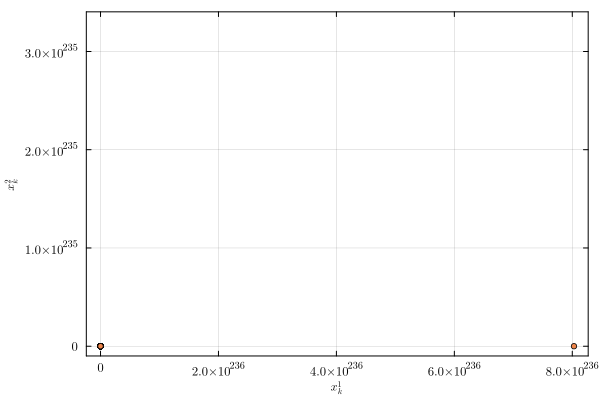

In [107]:
X_CE, _ = f_dataGen_CL(x₀, K_CE, N)
plot_CE = scatter(plot_data_exp, X_CE[1,:], X_CE[2,:], markersize = 3, markershape = :circle)

Notice that the two distributions do not share the same support exactly. That is,
the new system visits states that were not experienced during the experiment and learning phase. These regions of the state-space may contain nonlinearities, discontinuities, unpredicted safety violations. The responsibility of data-conforming control is to prevent such sudden generalization beyond learning data, and to enforce that the new system's distribution is close (under some norm) to the data distribution.

In [97]:
function solveProb5(γ_F)
    Σ_data = 1/(N) * X * X'
    model = Model(Mosek.Optimizer);
    rₓ = size(A)[1]
    rᵤ = size(B)[2]

    @variable(model, Σ[i=1:rₓ, j=1:rₓ], PSD)
    @variable(model, Z_F[i=1:rₓ, j=1:rₓ], PSD)
    @variable(model, Z₀[i=1:rᵤ, j=1:rᵤ], PSD)
    @variable(model, L[i=1:rᵤ, j=1:rₓ])

    @objective(model, Min, tr(Q*Σ) + tr(R*Z₀) + γ_F * tr(Z_F))

    @constraint(model, Σ - (1e-6I) >= 0, PSDCone())
    @constraint(model, [Z₀ L; L' Σ] >= 0, PSDCone())
    # Lyupanov
    @constraint(model, Σ - (Â*Σ*Â' + B̂*L*Â' + Â*L'*B̂' +  B̂*Z₀*B̂' + W + B̂*V*B̂') >= 0, PSDCone());
    @constraint(model, Σ - (Â*Σ*Â' + B̂*L*Â' + Â*L'*B̂' +  B̂*Z₀*B̂' + W + B̂*V*B̂') <= 0, PSDCone());

    @constraint(model, [Z_F (Σ-Σ_data); (Σ-Σ_data) I] >= 0, PSDCone());
    #set_attribute(model, "INTPNT_CO_TOL_DFEAS", 1e-10)
    set_silent(model)
    optimize!(model);

    L, Σ, Z₀ = value.(L), value.(Σ), value.(Z₀)
    K_prob5 = L * inv(Σ)
    
    return K_prob5, Σ
end

solveProb5 (generic function with 1 method)

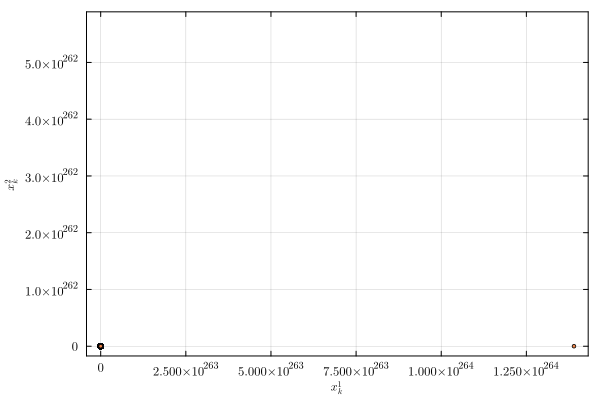

In [105]:
γ_F = 0
K_prob5, _ = solveProb5(γ_F)
X_prob5_0, _ = f_dataGen_CL(x₀, K_prob5, N)
plot_prob5_0 = scatter(plot_data_exp, X_prob5_0[1,:], X_prob5_0[2,:], markersize = 2)

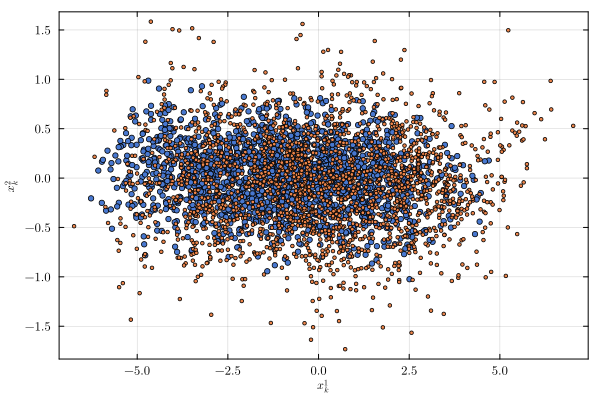

In [101]:
γ_F = 10
K_prob5, _ = solveProb5(γ_F)
X_prob5_1, _ = f_dataGen_CL(x₀, K_prob5, N)
plot_prob5_1 = scatter(plot_data_exp, X_prob5_1[1,:], X_prob5_1[2,:], markersize = 2)

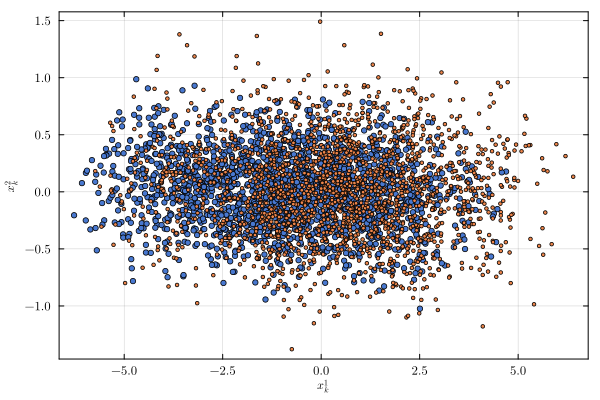

In [102]:
γ_F = 100
K_prob5, _ = solveProb5(γ_F)
X_prob5_20, _ = f_dataGen_CL(x₀, K_prob5, N)
plot_prob5_20 = scatter(plot_data_exp, X_prob5_20[1,:], X_prob5_20[2,:], markersize = 2, order = 1)

In [15]:
x_minimum = minimum([minimum(X[1,:]), minimum(X_prob5_0[1,:]), minimum(X_prob5_1[1,:]), minimum(X_prob5_20[1,:])])
x_maximum = maximum([maximum(X[1,:]), maximum(X_prob5_0[1,:]), maximum(X_prob5_1[1,:]), maximum(X_prob5_20[1,:])])
x_limits = (x_minimum, x_maximum)

y_minimum = minimum([minimum(X[2,:]), minimum(X_prob5_0[2,:]), minimum(X_prob5_1[2,:]), minimum(X_prob5_20[2,:])])
y_maximum = maximum([maximum(X[2,:]), maximum(X_prob5_0[2,:]), maximum(X_prob5_1[2,:]), maximum(X_prob5_20[2,:])])
y_limits = (y_minimum, y_maximum)

plt = plot(
    framestyle = :box,
    yguidefontsize = 8,
    xguidefontsize = 8,
    xtickfontsize = 8,
    ytickfontsize = 8,
    ylabel = L"$x^2_k$",
    xlabel = L"$x^1_k$",
    palette = :seaborn_muted,
    legend=:none,
    foreground_color_legend = nothing,
    legendfontsize=5,
    fontfamily = "Computer Modern",
    markersize = 2,
    titlefontsize = 8,
)
MarkerSize = 2
plot_CE = scatter(plt, X_CE[1,:], X_CE[2,:], markersize = MarkerSize, markershape = :xcross, bottom_margin = [-2mm 0mm], title = "(a)")
plot_prob5_0 = scatter(plt, X_prob5_0[1,:], X_prob5_0[2,:], markersize = MarkerSize, markershape = :xcross, bottom_margin = [-2mm 0mm], title = "(b)")
plot_prob5_1 = scatter(plt, X_prob5_1[1,:], X_prob5_1[2,:], markersize = MarkerSize, markershape = :xcross, bottom_margin = [-2mm 0mm], title = "(c)")
plot_prob5_20 = scatter(plt, X_prob5_20[1,:], X_prob5_20[2,:], markersize = MarkerSize, markershape = :xcross, bottom_margin = [-2mm 0mm], title = "(d)")
plots_list = [plot_CE, plot_prob5_0, plot_prob5_1, plot_prob5_20]
for i = 1:length(plots_list)
    scatter!(plots_list[i], X[1,:], X[2,:], xlims = x_limits, ylims = y_limits, xlabel = "", ylabel = "", 
    xticks = [ceil(x_minimum), 0, floor(x_maximum)], yticks = [ceil(y_minimum), 0, floor(y_maximum)], 
    markersize = MarkerSize, markerstrokewidth=1, markershape = :rect)
end


UndefVarError: UndefVarError: `mm` not defined

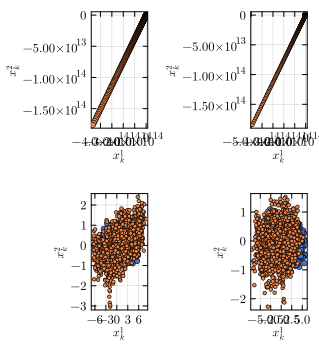

In [16]:
width = 320
height = 360
Fig1 = plot(plot_CE, plot_prob5_0, plot_prob5_1, plot_prob5_20, layout = (2,2), size = (width, height))

In [17]:
Fig1
savefig("figs/Prob5.pdf")

"/Users/mohammad/Documents/GitHub/Data-Conforming-Control/DataConformingControl/figs/Prob5.pdf"

In [18]:
D = [X;U]

3×2000 Matrix{Float64}:
 0.0       -0.315977   -0.0724913  …   0.469845   0.661536   0.813897
 0.0        0.0475719  -0.425407       0.243224   0.115901   0.0709074
 0.239779  -0.583635    4.2456        -2.6491    -0.665738  -0.962672

In [91]:
function solveProb6(γ)
    rₓ = size(A)[1]
    rᵤ = size(B)[2]
    
    Σ_data = 1/(N) * X * X'
    Γ_data = 1/(N) * D * D'
    H_data = Γ_data[1:rₓ,rₓ+1:end]
    Υ = cat(V, zeros(rₓ,rₓ); dims=(1,2))
    model = Model(Mosek.Optimizer);
    

    @variable(model, Σ[i=1:rₓ, j=1:rₓ], PSD)
    @variable(model, Z₀[i=1:rᵤ, j=1:rᵤ], PSD)
    @variable(model, L[i=1:rᵤ, j=1:rₓ])
    @variable(model, Z₁[i=1:rₓ+rᵤ, j=1:rₓ+rᵤ])
    @variable(model, Z₂[i=1:rᵤ, j=1:rᵤ])
    @variable(model, Z₃[i=1:rₓ, j=1:rₓ])

    @objective(model, Min, tr(Q*Σ) + tr(R*Z₀) 
    + γ * (tr(inv(Γ_data) * Z₁) + tr(inv(V) * Z₂) + tr(Σ_data * Z₃)))

    @constraint(model, Σ - (1e-6I) >= 0, PSDCone())
    @constraint(model, [Z₀ L; L' Σ] >= 0, PSDCone())
    # Lyupanov
    @constraint(model, Σ - (Â*Σ*Â' + B̂*L*Â' + Â*L'*B̂' +  B̂*Z₀*B̂' + W + B̂*V*B̂') >= 0, PSDCone());
    @constraint(model, Σ - (Â*Σ*Â' + B̂*L*Â' + Â*L'*B̂' +  B̂*Z₀*B̂' + W + B̂*V*B̂') <= 0, PSDCone());

    # The Z's
    @constraint(model, [Z₃ I; I Σ] >= 0, PSDCone())
    @constraint(model, [Z₂ (L-H_data'*inv(Σ_data)*Σ); (L-H_data'*inv(Σ_data)*Σ)' Σ] >= 0, PSDCone())
    @constraint(model, [(Z₁-Υ) cat(Σ_data, L; dims=1); cat(Σ_data, L; dims=1)' Σ] >= 0, PSDCone())
    #set_attribute(model, "INTPNT_CO_TOL_DFEAS", 1e-10)
    set_silent(model)
    optimize!(model);

    L, Σ, Z₀ = value.(L), value.(Σ), value.(Z₀)
    K_prob6 = L * inv(Σ)
    
    return K_prob6, Σ
end

solveProb6 (generic function with 1 method)

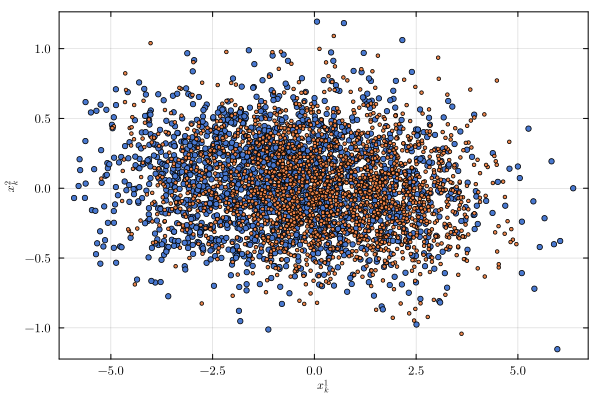

In [92]:
γ = 100
K_prob6, _ = solveProb6(γ)
X_prob6, _ = f_dataGen_CL(x₀, K_prob6, N)
plot_prob6 = scatter(plot_data_exp, X_prob6[1,:], X_prob6[2,:], markersize = 2, order = 1)